In [1]:
import random
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, random_split
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch
import torchvision
import matplotlib.pyplot as plt
import numpy as np
from ipywidgets import FileUpload
from IPython.display import display
from zipfile import ZipFile
import io
from PIL import Image, ImageOps
import pandas as pd
import time
import os
import cv2
from torchvision.transforms import functional as TF
import numpy as np

# Experiment I

## 1. Loading and Visualizing data


In [2]:
# Initializing parameters 

seed = 100
random.seed(seed)  
np.random.seed(seed)  
torch.manual_seed(seed) 
torch.cuda.manual_seed_all(seed)

transform_train = transforms.Compose([
    transforms.Resize((64, 64)),  
    transforms.RandomHorizontalFlip(),  
    transforms.RandomRotation(10),      
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),  
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

transform_test = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

# #loading data
dataset = datasets.ImageFolder(root='/Users/jane/Desktop/dataset0-9', transform=transform_train)
dataset_test = datasets.ImageFolder(root='/Users/jane/Desktop/dataset0-9', transform=transform_test)

# caculate train and test sizes
train_size = int(0.8 * len(dataset))  # 80% for training 
test_size = len(dataset) - train_size  

# random split 
train_dataset, _ = random_split(dataset, [train_size, test_size])
_, test_dataset = random_split(dataset_test, [train_size, test_size])

# create data loaders
train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False)



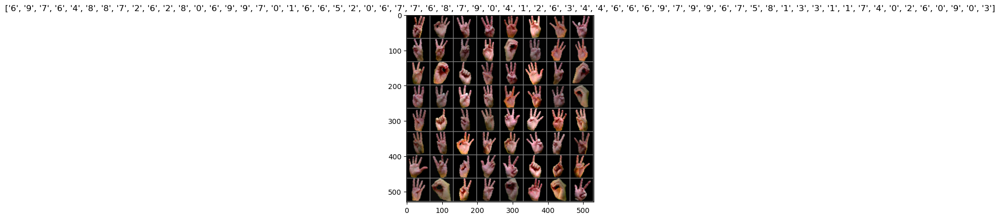

In [3]:
def imshow(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.5, 0.5, 0.5])
    std = np.array([0.5, 0.5, 0.5])
    inp = std * inp + mean  # unnormalize
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated

# Get a batch of training data
dataiter = iter(train_loader)
images, labels = next(dataiter)

# Make a grid from batch
out = torchvision.utils.make_grid(images)

imshow(out, title=[str(x.item()) for x in labels])

## 2. Training Model

In [4]:
#define training model 
class CNN(nn.Module):
    def __init__(self):
        super(CNN, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, 3, padding=1)
        self.bn1 = nn.BatchNorm2d(32)  # BatchNorm
        self.conv2 = nn.Conv2d(32, 64, 3, padding=1)
        self.bn2 = nn.BatchNorm2d(64)  # BN
        self.conv3 = nn.Conv2d(64, 128, 3, padding=1)
        self.bn3 = nn.BatchNorm2d(128)  # BN
        self.pool = nn.MaxPool2d(2, 2)
        self.dropout = nn.Dropout(0.25)  # BN
        self.fc1 = nn.Linear(128 * 8 * 8, 512)  
        self.fc2 = nn.Linear(512, 10)

    def forward(self, x):
        x = self.pool(F.relu(self.bn1(self.conv1(x))))  
        x = self.pool(F.relu(self.bn2(self.conv2(x))))  
        x = self.pool(F.relu(self.bn3(self.conv3(x))))  
        x = x.view(-1, 128 * 8 * 8)  
        x = self.dropout(x)  
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        return x


In [5]:
# 在使用GPU时，还应设置GPU的随机种子以确保结果的可重复性（如果可用）
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(seed)
    
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = CNN().to(device)
optimizer = optim.Adam(model.parameters(), lr=0.001)
criterion = nn.CrossEntropyLoss()

def calculate_accuracy(y_pred, y_true):
    predicted = torch.max(y_pred, 1)[1]
    correct = (predicted == y_true).float()
    accuracy = correct.sum() / len(correct)
    return accuracy


train_losses = []
test_losses = []
train_accuracies = []
test_accuracies = []


# initializing 
train_losses = []
test_losses = []
train_accuracies = []
test_accuracies = []

H = {
    "train_loss": [],
    "train_acc": [],
    "val_loss": [],
    "val_acc": []
     }

startTime = time.time()

In [6]:
# Training Model 
for epoch in range(10):  # epoch = 10
    model.train()
    train_loss = 0
    train_accuracy = 0

    for data, target in train_loader:
        data, target = data.to(device), target.to(device)
        optimizer.zero_grad()
        output = model(data)
        loss = criterion(output, target)
        train_loss += loss.item()
        train_accuracy += calculate_accuracy(output, target)
        loss.backward()
        optimizer.step()


    train_loss /= len(train_loader)
    train_accuracy /= len(train_loader)
    train_losses.append(train_loss)
    train_accuracies.append(train_accuracy)
    

    # Evaluation
    model.eval()
    test_loss = 0
    test_accuracy = 0
    with torch.no_grad():
        for data, target in test_loader:
            data, target = data.to(device), target.to(device)
            output = model(data)
            loss = criterion(output, target)
            test_loss += loss.item()
            test_accuracy += calculate_accuracy(output, target)

    # calculate losses and accuracies
    test_loss /= len(test_loader)
    test_accuracy /= len(test_loader)
    test_losses.append(test_loss)
    test_accuracies.append(test_accuracy)
    
    # Updating training history
    H["train_loss"].append(train_loss)
    H["train_acc"].append(train_accuracy.item())
    H["val_loss"].append(test_loss)
    H["val_acc"].append(test_accuracy.item())

# Create DF
df_metrics = pd.DataFrame({
    'train_loss': train_losses,
    'train_acc': [acc.item() for acc in train_accuracies],  # 使用列表推导式并应用 .item()
    'test_loss': test_losses,
    'test_acc': [acc.item() for acc in test_accuracies]    # 使用列表推导式并应用 .item()
})

print(df_metrics)



   train_loss  train_acc  test_loss  test_acc
0    4.644770   0.188079   2.383801  0.272569
1    1.828398   0.538773   1.550538  0.590278
2    0.956433   0.722801   1.030871  0.781250
3    0.563011   0.850116   0.707694  0.769097
4    0.355517   0.907407   0.315925  0.925347
5    0.288581   0.907407   0.297280  0.914931
6    0.249989   0.927662   0.125944  0.979167
7    0.147470   0.955440   0.136616  0.940972
8    0.145238   0.961227   0.082520  0.979167
9    0.114186   0.960648   0.067803  0.989583


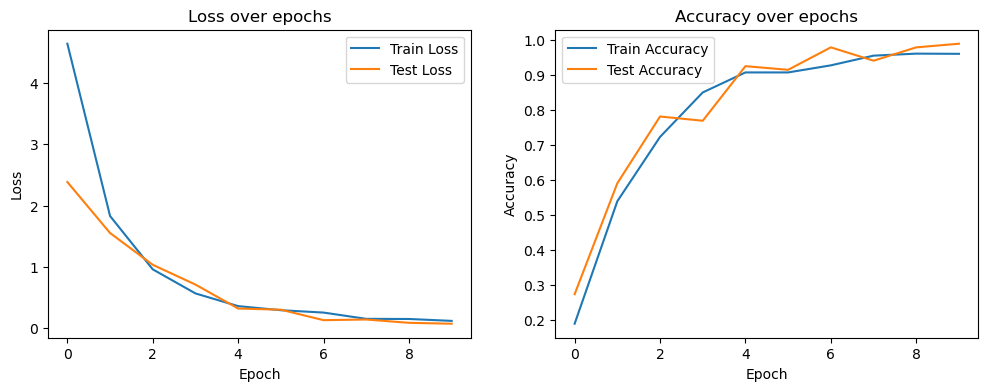

In [7]:

# Visualizing losses and accuracies
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(df_metrics['train_loss'], label='Train Loss')
plt.plot(df_metrics['test_loss'], label='Test Loss')
plt.title('Loss over epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(df_metrics['train_acc'], label='Train Accuracy')
plt.plot(df_metrics['test_acc'], label='Test Accuracy')
plt.title('Accuracy over epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.show()

In [8]:
endTime = time.time()
print("Total time taken to train the model: {:.2f}s".format(endTime - startTime))

Total time taken to train the model: 30.50s


In [9]:
H = pd.DataFrame(H)
H.head().style.applymap(lambda x : "background-color: #fadcb4")\
.set_table_styles([{'selector' : '', 'props' : [('border', '2px solid black')]}])

,train_loss,train_acc,val_loss,val_acc
0,4.644770,0.188079,2.383801,0.272569
1,1.828398,0.538773,1.550538,0.590278
2,0.956433,0.722801,1.030871,0.781250
3,0.563011,0.850116,0.707694,0.769097
4,0.355517,0.907407,0.315925,0.925347


## 3. Model Evaluation 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

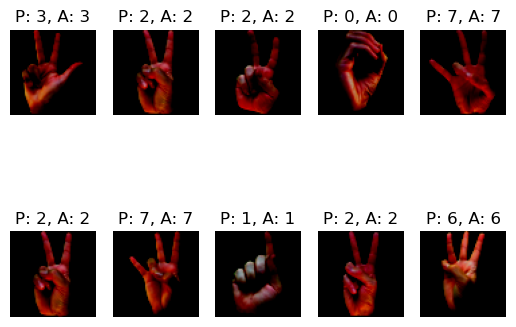

In [10]:
model.eval()
wrong_cases = []
correct_cases = []

with torch.no_grad():
    for data, target in test_loader:
        data, target = data.to(device), target.to(device)
        output = model(data)
        pred = output.argmax(dim=1, keepdim=True)
        wrong_idx = (pred != target.view_as(pred)).nonzero()[:, 0]
        wrong_samples = data[wrong_idx]
        wrong_preds = pred[wrong_idx]
        actual_preds = target.view_as(pred)[wrong_idx]
        for i in range(len(wrong_idx)):
            wrong_cases.append((wrong_samples[i], wrong_preds[i], actual_preds[i]))
        correct_idx = (pred == target.view_as(pred)).nonzero()[:, 0]
        correct_samples = data[correct_idx]
        correct_preds = pred[correct_idx]
        for i in range(correct_samples.shape[0]):
            correct_cases.append((correct_samples[i], correct_preds[i], target[correct_idx][i]))

            
#Show rightclassification 
for i, (sample, correct_pred, actual) in enumerate(correct_cases[:10]):
    plt.subplot(2, 5, i + 1)
    plt.imshow(sample.cpu().numpy().transpose(1, 2, 0))
    plt.title(f"P: {correct_pred.item()}, A: {actual.item()}")
    plt.axis('off')
plt.show()




Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


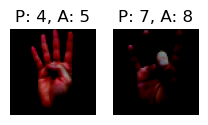

In [11]:
# Show misclassification
for i, (sample, wrong_pred, actual_pred) in enumerate(wrong_cases[:10]):
    plt.subplot(2, 5, i + 1)
    plt.imshow(sample.cpu().numpy().transpose(1, 2, 0))
    plt.title(f"P: {wrong_pred.item()}, A: {actual_pred.item()}")
    plt.axis('off')
plt.show()


In [12]:
print("Number of misclassified samples:", len(wrong_cases))

Number of misclassified samples: 2


In [13]:
# Evaluation 
model.eval()

# Initialition 
correct = 0
total = 0

# Model 
with torch.no_grad():
    for data, target in test_loader:
       
        data, target = data.to(device), target.to(device)
        
        outputs = model(data)
        _, predicted = torch.max(outputs.data, 1)

        total += target.size(0)
        correct += (predicted == target).sum().item()

# Calculate Accuracy 
accuracy = 100 * correct / total
print(f'Accuracy of the network on the test images: {accuracy}%')

Accuracy of the network on the test images: 98.57142857142857%


## Simple Calculator / Prediction

In [14]:
#seperate hand gesture from the background 
def simplify_background(img_pil):
    img_np = np.array(img_pil)
    gray = cv2.cvtColor(img_np, cv2.COLOR_RGB2GRAY)
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)
    _, thresh = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    #thresh = cv2.adaptiveThreshold(blurred, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY, 11, 2)
    img_np = img_np * (thresh[:, :, None] > 0)
    img_pil = Image.fromarray(img_np)
    return img_pil


# Image preprocessing
transform = transforms.Compose([
    transforms.Resize((64, 64)),  # Resize to be consistent with training
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))  # Normalize as per training
])


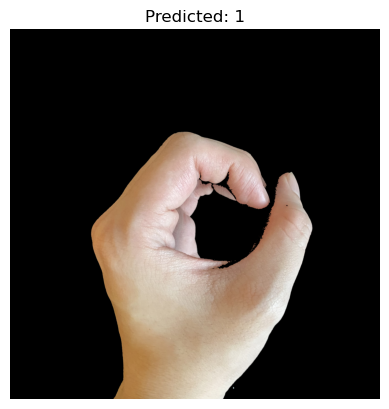

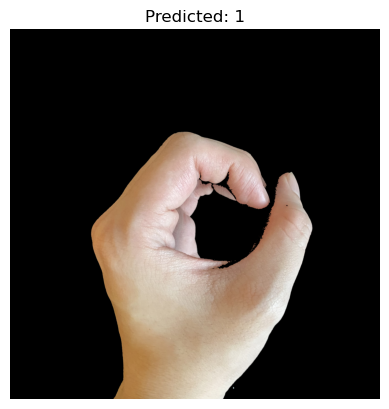

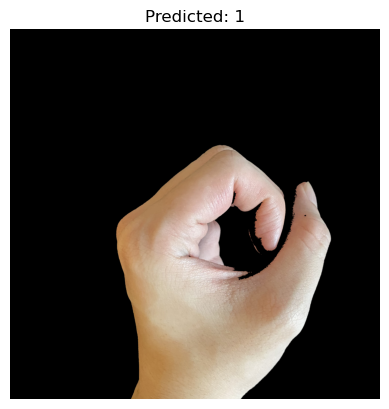

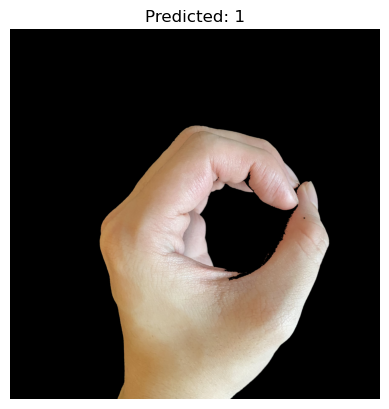

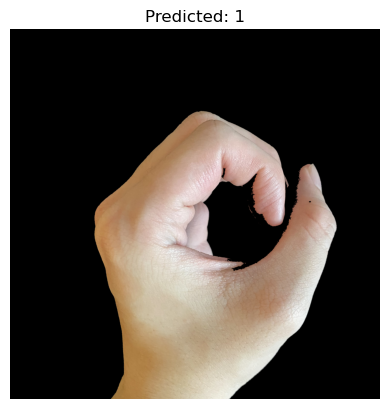

True Digit: 0
Predicted Digits: [1, 1, 1, 1, 1]
Accuracy: 0.0%


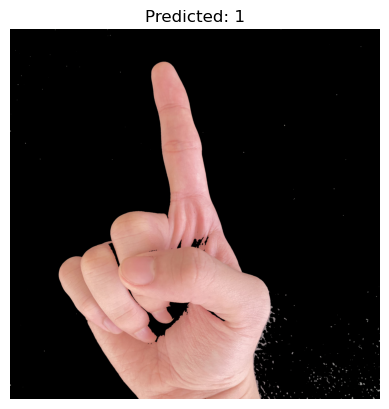

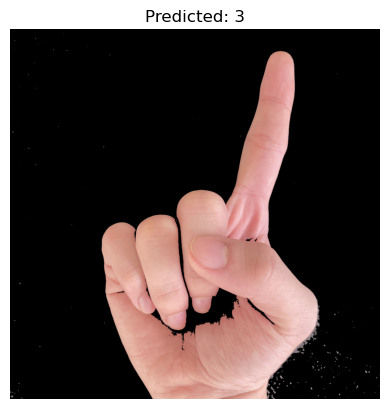

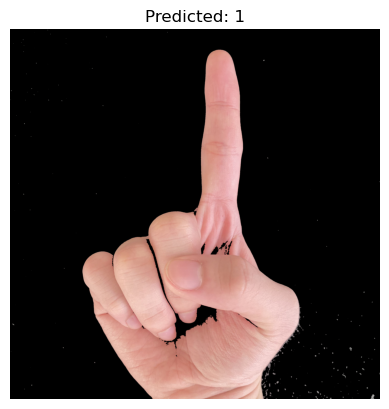

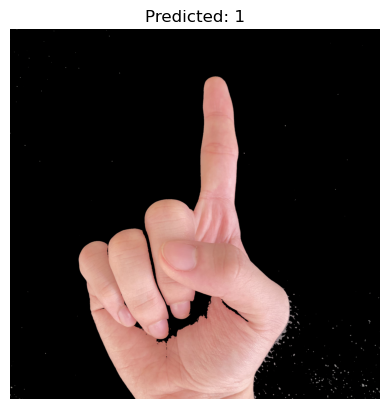

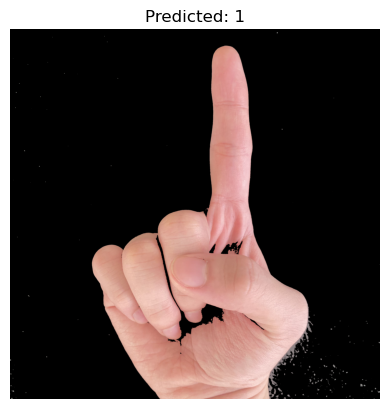

True Digit: 1
Predicted Digits: [1, 3, 1, 1, 1]
Accuracy: 80.0%


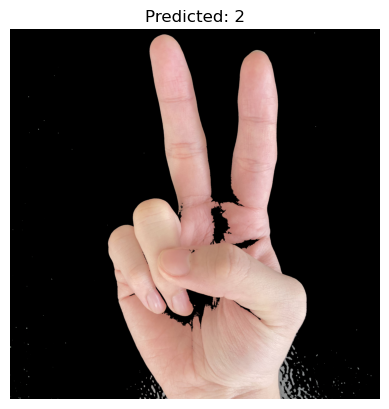

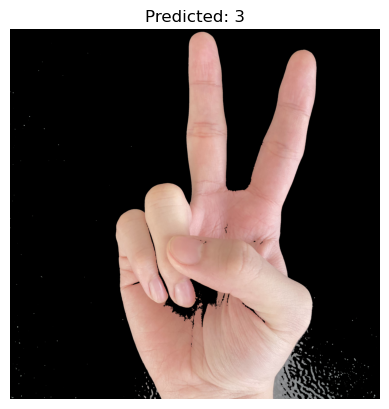

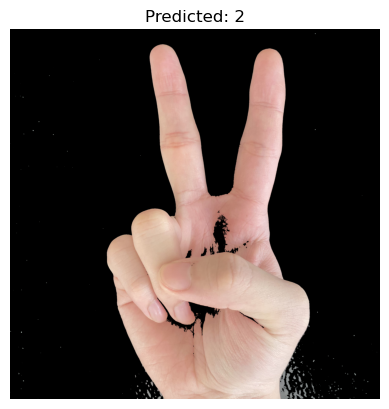

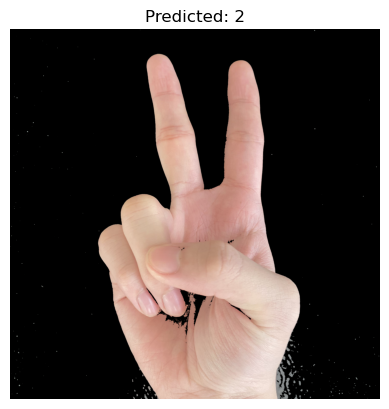

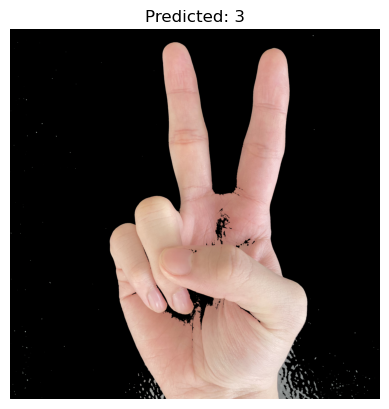

True Digit: 2
Predicted Digits: [2, 3, 2, 2, 3]
Accuracy: 60.0%


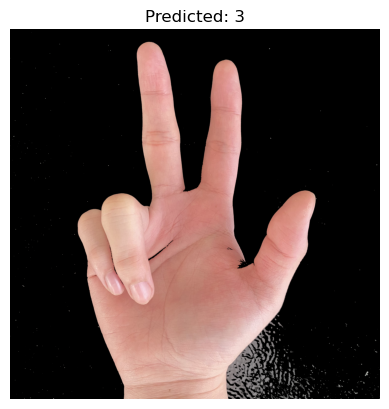

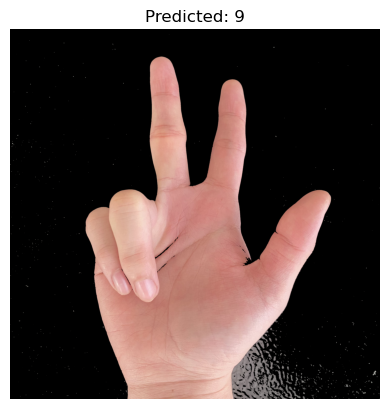

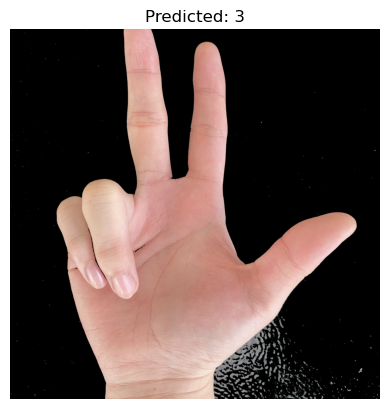

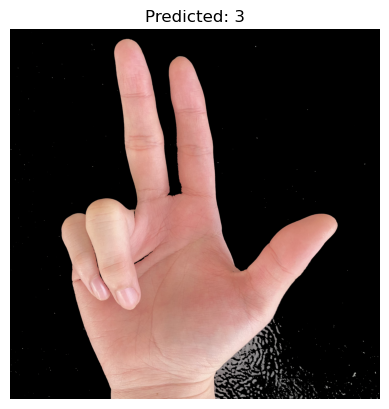

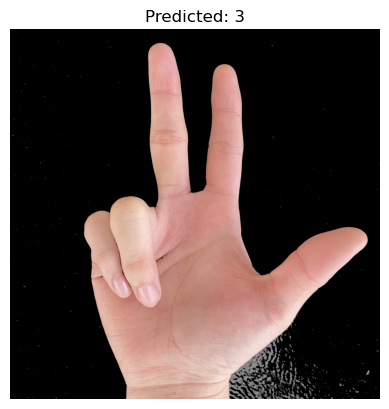

True Digit: 3
Predicted Digits: [3, 9, 3, 3, 3]
Accuracy: 80.0%


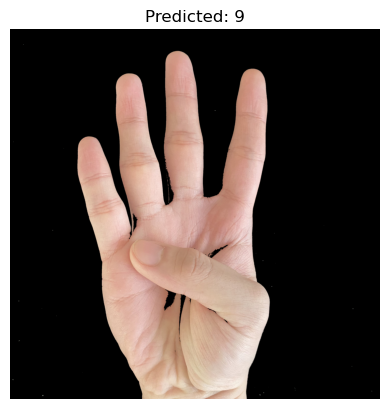

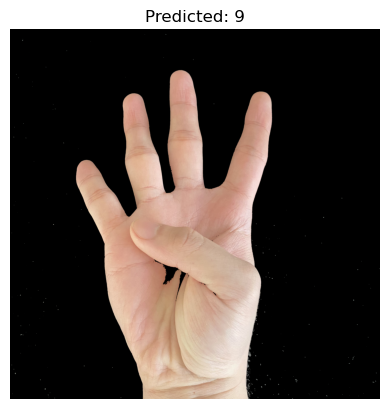

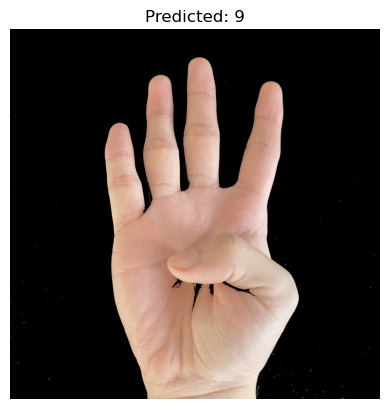

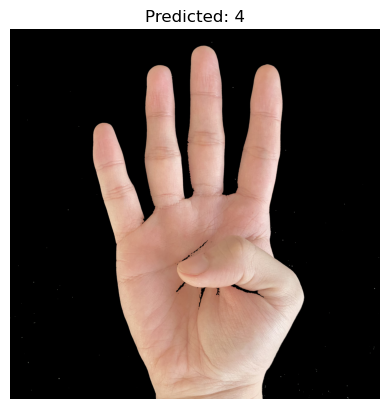

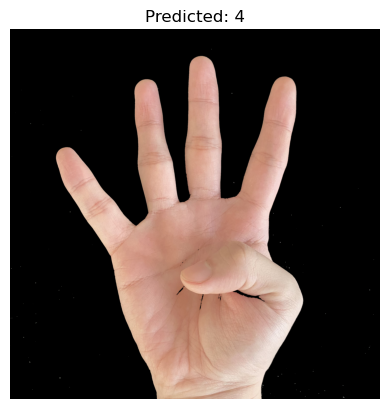

True Digit: 4
Predicted Digits: [9, 9, 9, 4, 4]
Accuracy: 40.0%


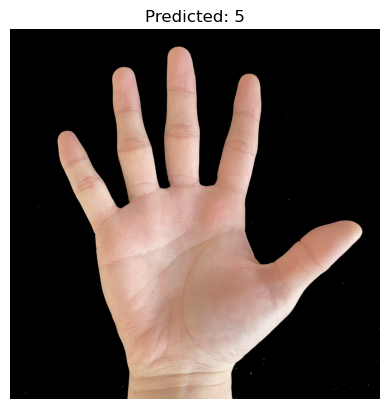

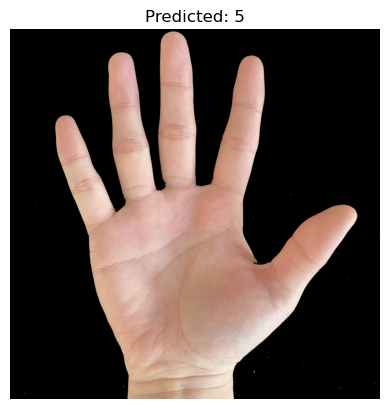

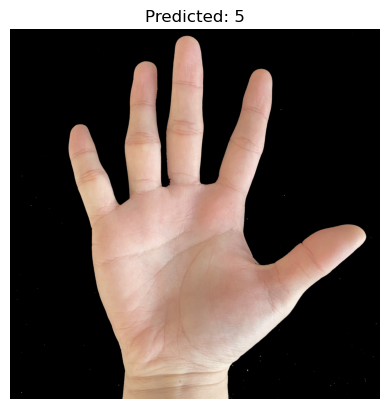

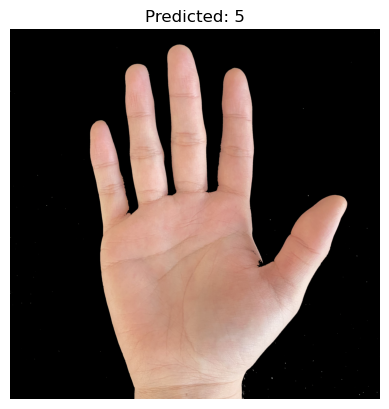

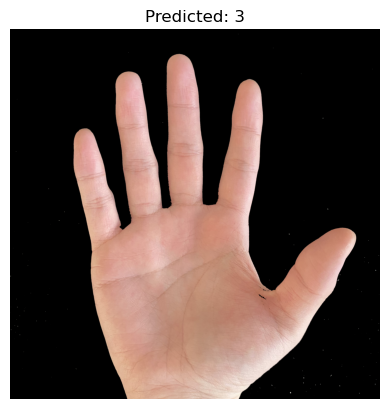

True Digit: 5
Predicted Digits: [5, 5, 5, 5, 3]
Accuracy: 80.0%


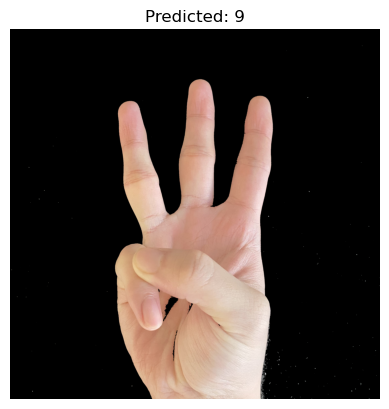

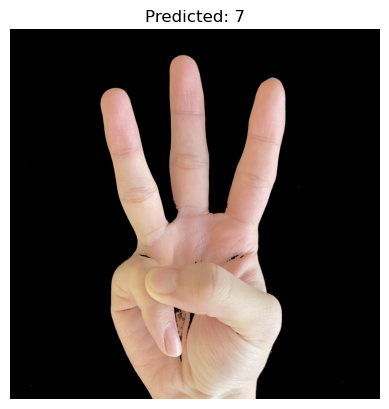

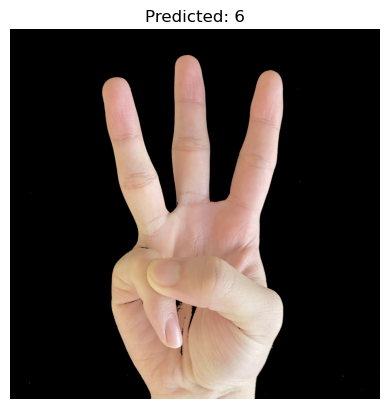

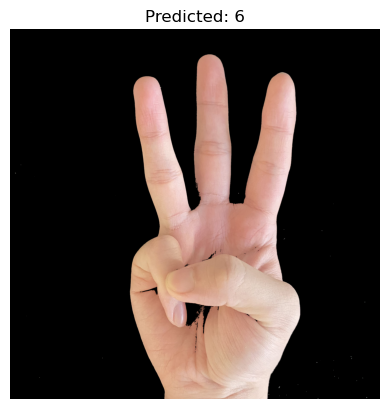

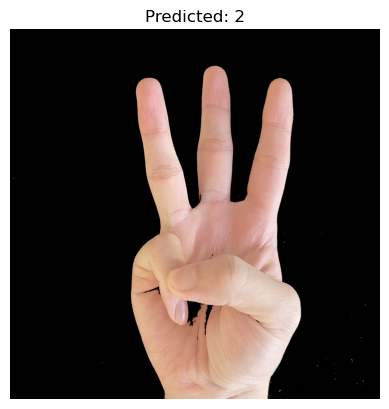

True Digit: 6
Predicted Digits: [9, 7, 6, 6, 2]
Accuracy: 40.0%


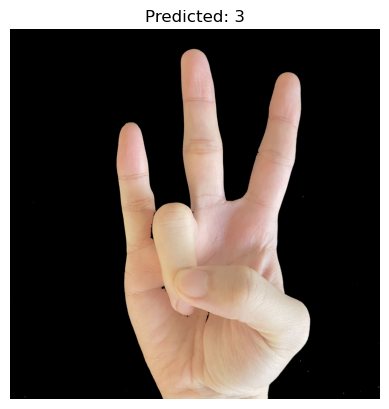

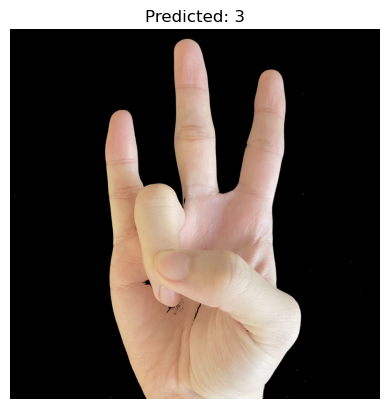

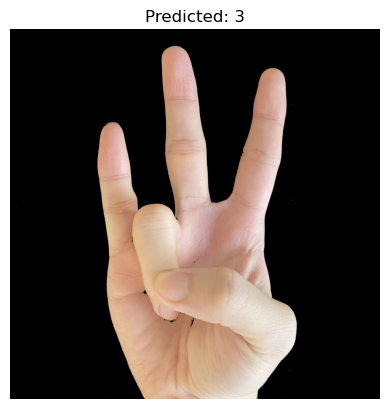

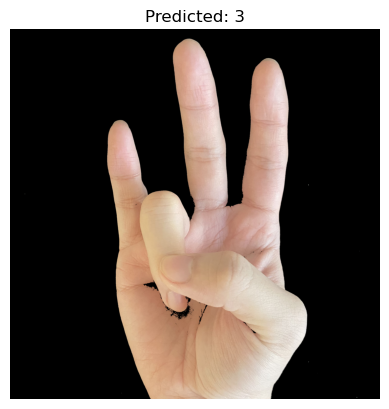

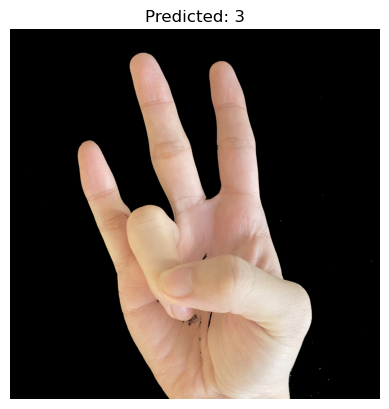

True Digit: 7
Predicted Digits: [3, 3, 3, 3, 3]
Accuracy: 0.0%


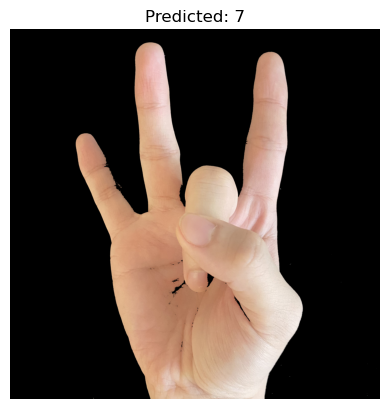

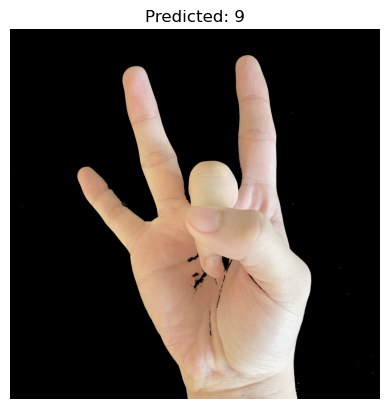

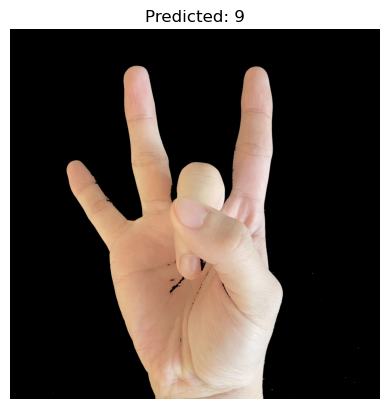

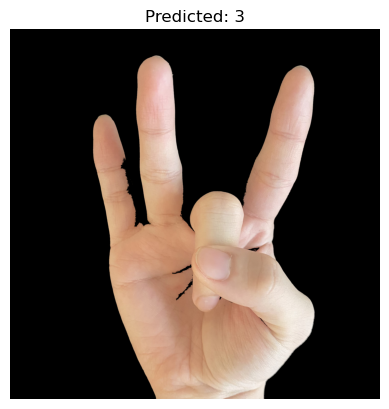

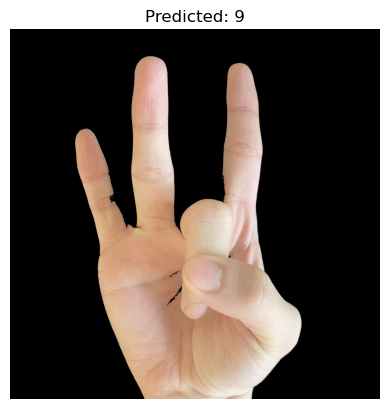

True Digit: 8
Predicted Digits: [7, 9, 9, 3, 9]
Accuracy: 0.0%


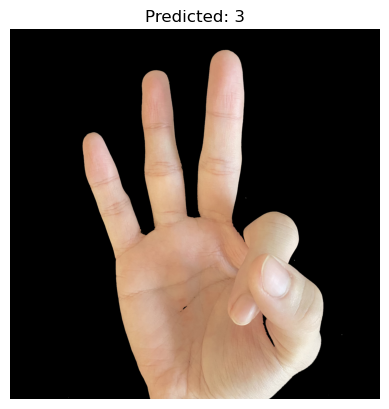

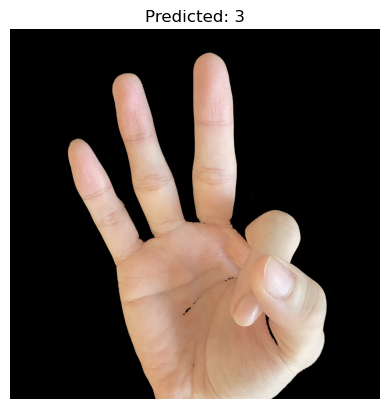

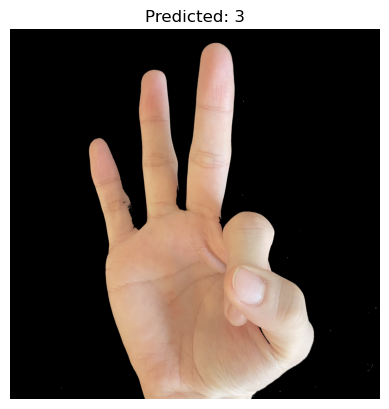

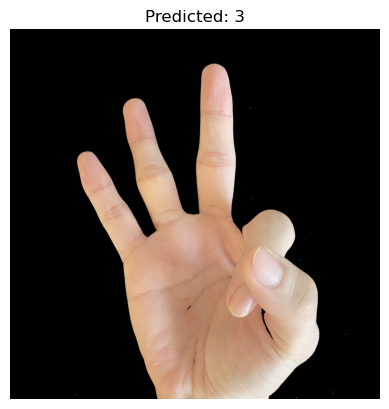

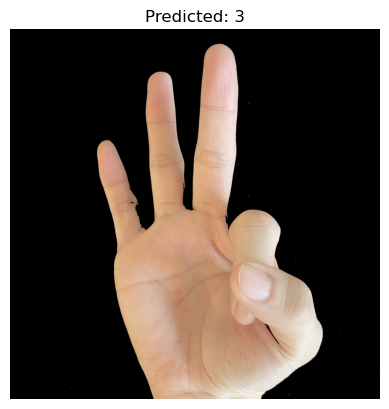

True Digit: 9
Predicted Digits: [3, 3, 3, 3, 3]
Accuracy: 0.0%


In [15]:
# Define a function to predict the digit from a folder of images

results = []

def predict_folder(folder_path, model):
    if not os.path.exists(folder_path):
        raise Exception("Folder path does not exist.")
        
    # Get the true label (folder name) as the expected digit
    true_digit = int(os.path.basename(folder_path))
    predictions = []
    
    # Iterate through the folder
    for img_file in os.listdir(folder_path):
        img_path = os.path.join(folder_path, img_file)
 
        # Check if it's a file
        if os.path.isfile(img_path):
            if img_path.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp')):
            # Load and preprocess the image
                img = Image.open(img_path).convert('RGB')
                img = ImageOps.exif_transpose(img)  # Rotate the image 
                img_simplified = simplify_background(img)  # Apply background simplification
                img_transformed = transform(img_simplified)  # Apply preprocessing 


                # Add batch dimension and pass to model
                img_transformed = img_transformed.unsqueeze(0).to(device)
                model.eval()  # Set the model to evaluation mode
                with torch.no_grad():
                    outputs = model(img_transformed)
                    _, predicted = torch.max(outputs, 1)
                    predicted = predicted.cpu().numpy()[0]  # Extract prediction to numpy
                
                # Append the prediction to the list
                predictions.append(predicted)
                
                # Display the image and prediction result
                plt.imshow(img_simplified)
                plt.title(f'Predicted: {predicted}')
                plt.axis('off')
                plt.show()
    
     # Calculate accuracy by comparing predictions with true_digit
    correct_predictions = sum(1 for pred in predictions if pred == true_digit)
    total_predictions = len(predictions)
    if total_predictions == 0:
        accuracy = na
    else:
        accuracy = correct_predictions / total_predictions * 100
    results.append([true_digit, predictions, accuracy])
    
    print(f"True Digit: {true_digit}")
    print(f"Predicted Digits: {predictions}")
    print(f"Accuracy: {accuracy}%")
    
def is_number(s):
    try:
        int(s)
        return True
    except ValueError:
        return False
    
# Predict the digits for each subfolder
base_folder = "/Users/jane/Desktop/Hand_W"  # Base folder containing subfolders 0-9
for subfolder in sorted(filter(is_number, os.listdir(base_folder)), key=lambda x: int(x)):
    subfolder_path = os.path.join(base_folder, subfolder)
    if os.path.isdir(subfolder_path):
        predict_folder(subfolder_path, model)
    

In [16]:
df_results = pd.DataFrame(results, columns=['True Number', 'Predicted Number', 'Accuracy'])
print(df_results)

   True Number Predicted Number  Accuracy
0            0  [1, 1, 1, 1, 1]       0.0
1            1  [1, 3, 1, 1, 1]      80.0
2            2  [2, 3, 2, 2, 3]      60.0
3            3  [3, 9, 3, 3, 3]      80.0
4            4  [9, 9, 9, 4, 4]      40.0
5            5  [5, 5, 5, 5, 3]      80.0
6            6  [9, 7, 6, 6, 2]      40.0
7            7  [3, 3, 3, 3, 3]       0.0
8            8  [7, 9, 9, 3, 9]       0.0
9            9  [3, 3, 3, 3, 3]       0.0


# Experiment II

In [17]:
#Initializing parameters 
seed = 100
random.seed(seed)  
np.random.seed(seed)  
torch.manual_seed(seed) 
torch.cuda.manual_seed_all(seed)

# Separate hand gesture from the background
def simplify_background(img_pil):
    img_np = np.array(img_pil)
    gray = cv2.cvtColor(img_np, cv2.COLOR_RGB2GRAY)
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)
    _, thresh = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    img_np = img_np * (thresh[:, :, None] > 0)
    img_pil = Image.fromarray(img_np)
    return img_pil

# Define custom transforms for training and testing datasets
class TransformDataset(object):
    def __init__(self, with_background_simplification=False, is_train=True):
        self.with_background_simplification = with_background_simplification
        base_transforms = [transforms.Resize((64, 64)), transforms.ToTensor(), transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))]
        
        if is_train:
            # Additional transforms for training dataset
            train_transforms = [
                transforms.RandomHorizontalFlip(),
                transforms.RandomRotation(10),
                transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
            ]
            self.transforms = transforms.Compose(train_transforms + base_transforms)
        else:
            # Only base transforms for test dataset
            self.transforms = transforms.Compose(base_transforms)
    
    def __call__(self, img):
        if self.with_background_simplification:
            img = simplify_background(img)
        return self.transforms(img)

# Function to create and return the datasets
def create_datasets(root_dir, with_background_simplification, is_train):
    dataset = datasets.ImageFolder(
        root=root_dir,
        transform=TransformDataset(
            with_background_simplification=with_background_simplification,
            is_train=is_train
        )
    )
    return dataset

# Create datasets
dataset1_train = create_datasets('/Users/jane/Desktop/newdataset0-9', True, True)
dataset1_test = create_datasets('/Users/jane/Desktop/newdataset0-9', True, False)
dataset2_train = create_datasets('/Users/jane/Desktop/dataset0-9', False, True)
dataset2_test = create_datasets('/Users/jane/Desktop/dataset0-9', False, False)

# Calculate train and test sizes for both datasets
train_size1 = int(0.8 * len(dataset1_train))  # 80% for training 
test_size1 = len(dataset1_test) - train_size1

train_size2 = int(0.8 * len(dataset2_train))  # 80% for training 
test_size2 = len(dataset2_test) - train_size2

# Random split for dataset 1 and dataset 2
train_dataset1, _ = random_split(dataset1_train, [train_size1, test_size1])
_, test_dataset1 = random_split(dataset1_test, [train_size1, test_size1])

train_dataset2, _ = random_split(dataset2_train, [train_size2, test_size2])
_, test_dataset2 = random_split(dataset2_test, [train_size2, test_size2])

# Combine the two datasets
combined_train_dataset = torch.utils.data.ConcatDataset([train_dataset1, train_dataset2])
combined_test_dataset = torch.utils.data.ConcatDataset([test_dataset1, test_dataset2])

# Create data loaders for combined datasets
train_loader = DataLoader(combined_train_dataset, batch_size=64, shuffle=True)
test_loader = DataLoader(combined_test_dataset, batch_size=64, shuffle=False)

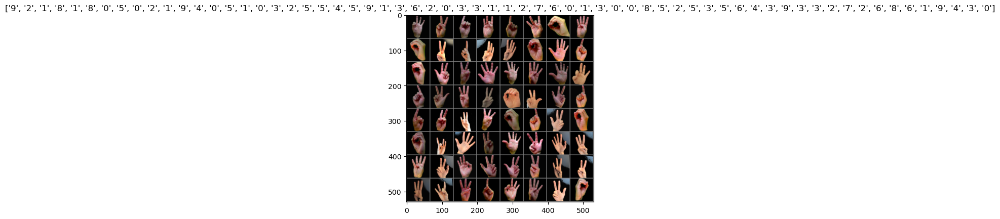

In [18]:
def imshow(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.5, 0.5, 0.5])
    std = np.array([0.5, 0.5, 0.5])
    inp = std * inp + mean  # unnormalize
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated

# Get a batch of training data
dataiter = iter(train_loader)
images, labels = next(dataiter)

# Make a grid from batch
out = torchvision.utils.make_grid(images)

imshow(out, title=[str(x.item()) for x in labels])

## 2. Training Model

In [19]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = CNN().to(device)
optimizer = optim.Adam(model.parameters(), lr=0.001)
criterion = nn.CrossEntropyLoss()

def calculate_accuracy(y_pred, y_true):
    predicted = torch.max(y_pred, 1)[1]
    correct = (predicted == y_true).float()
    accuracy = correct.sum() / len(correct)
    return accuracy

# initializing 
train_losses = []
test_losses = []
train_accuracies = []
test_accuracies = []

H = {
    "train_loss": [],
    "train_acc": [],
    "val_loss": [],
    "val_acc": []
     }

startTime = time.time()

# Training Model 
for epoch in range(10):  # epoch = 10
    model.train()
    train_loss = 0
    train_accuracy = 0

    for data, target in train_loader:
        data, target = data.to(device), target.to(device)
        optimizer.zero_grad()
        output = model(data)
        loss = criterion(output, target)
        train_loss += loss.item()
        train_accuracy += calculate_accuracy(output, target)
        loss.backward()
        optimizer.step()


    train_loss /= len(train_loader)
    train_accuracy /= len(train_loader)
    train_losses.append(train_loss)
    train_accuracies.append(train_accuracy)
    

    # Evaluation
    model.eval()
    test_loss = 0
    test_accuracy = 0
    with torch.no_grad():
        for data, target in test_loader:
            data, target = data.to(device), target.to(device)
            output = model(data)
            loss = criterion(output, target)
            test_loss += loss.item()
            test_accuracy += calculate_accuracy(output, target)

    # calculate losses and accuracies
    test_loss /= len(test_loader)
    test_accuracy /= len(test_loader)
    test_losses.append(test_loss)
    test_accuracies.append(test_accuracy)
    
    # Updating training history
    H["train_loss"].append(train_loss)
    H["train_acc"].append(train_accuracy.item())
    H["val_loss"].append(test_loss)
    H["val_acc"].append(test_accuracy.item())

# Create DF
df_metrics = pd.DataFrame({
    'train_loss': train_losses,
    'train_acc': [acc.item() for acc in train_accuracies],  # 使用列表推导式并应用 .item()
    'test_loss': test_losses,
    'test_acc': [acc.item() for acc in test_accuracies]    # 使用列表推导式并应用 .item()
})

print(df_metrics)


   train_loss  train_acc  test_loss  test_acc
0    4.416959   0.154948   2.119486  0.389953
1    1.791547   0.348772   1.751691  0.410786
2    1.178094   0.626302   1.151049  0.727823
3    0.888246   0.748884   0.854975  0.758905
4    0.654517   0.819568   0.560834  0.843078
5    0.570856   0.826265   0.420062  0.869120
6    0.445311   0.862351   0.379477  0.869288
7    0.382811   0.893787   0.282216  0.916667
8    0.306709   0.919457   0.212807  0.932124
9    0.232607   0.938244   0.183455  0.947749


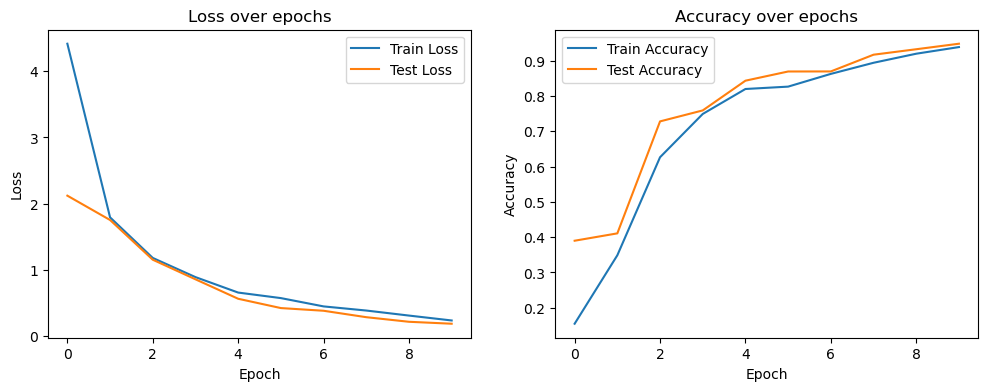

In [20]:
# Visualizing losses and accuracies
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(df_metrics['train_loss'], label='Train Loss')
plt.plot(df_metrics['test_loss'], label='Test Loss')
plt.title('Loss over epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(df_metrics['train_acc'], label='Train Accuracy')
plt.plot(df_metrics['test_acc'], label='Test Accuracy')
plt.title('Accuracy over epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.show()

In [21]:
endTime = time.time()
print("Total time taken to train the model: {:.2f}s".format(endTime - startTime))

Total time taken to train the model: 739.95s


## 3. Model Evaluation 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

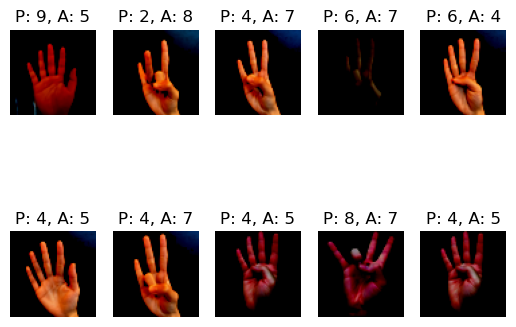

In [22]:
model.eval()
wrong_cases = []

with torch.no_grad():
    for data, target in test_loader:
        data, target = data.to(device), target.to(device)
        output = model(data)
        pred = output.argmax(dim=1, keepdim=True)
        wrong_idx = (pred != target.view_as(pred)).nonzero()[:, 0]
        wrong_samples = data[wrong_idx]
        wrong_preds = pred[wrong_idx]
        actual_preds = target.view_as(pred)[wrong_idx]
        for i in range(len(wrong_idx)):
            wrong_cases.append((wrong_samples[i], wrong_preds[i], actual_preds[i]))


# Show misclassification
for i, (sample, wrong_pred, actual_pred) in enumerate(wrong_cases[:10]):
    plt.subplot(2, 5, i + 1)
    plt.imshow(sample.cpu().numpy().transpose(1, 2, 0))
    plt.title(f"P: {wrong_pred.item()}, A: {actual_pred.item()}")
    plt.axis('off')
plt.show()


In [23]:
print("Number of misclassified samples:", len(wrong_cases))

Number of misclassified samples: 10


In [24]:
# Evaluation 
model.eval()

# Initialition 
correct = 0
total = 0

# Model 
with torch.no_grad():
    for data, target in test_loader:
       
        data, target = data.to(device), target.to(device)
        
        outputs = model(data)
        _, predicted = torch.max(outputs.data, 1)

        total += target.size(0)
        correct += (predicted == target).sum().item()

# Calculate Accuracy 
accuracy = 100 * correct / total
print(f'Accuracy of the network on the test images: {accuracy}%')

Accuracy of the network on the test images: 94.73684210526316%


## Simple Calculator/Prediction

In [25]:
# Image preprocessing
transform = transforms.Compose([
    transforms.Resize((64, 64)),  # Resize to be consistent with training
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))  # Normalize as per training
])


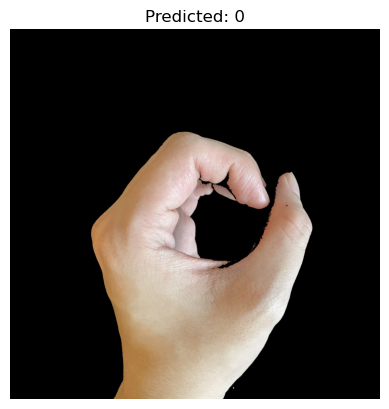

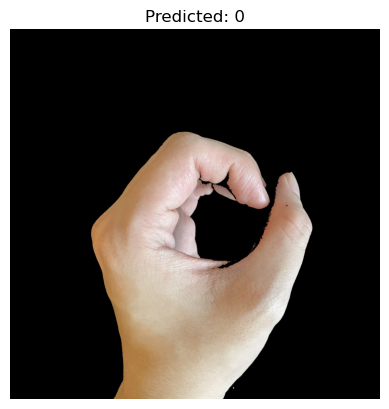

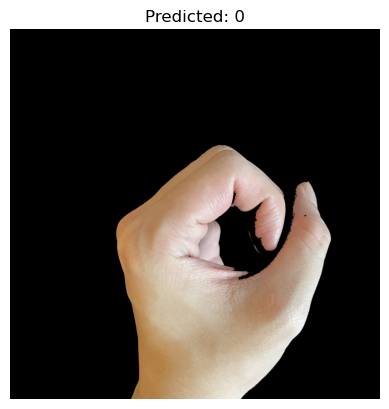

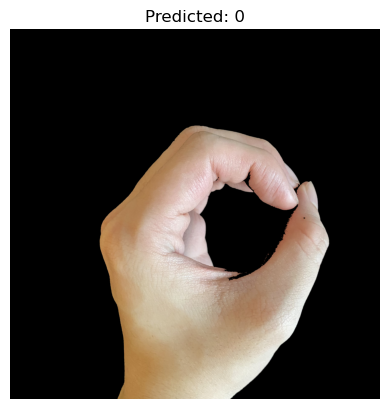

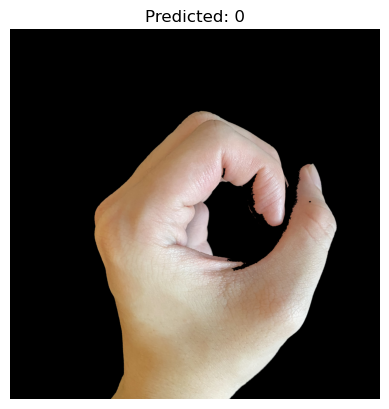

True Digit: 0
Predicted Digits: [0, 0, 0, 0, 0]
Accuracy: 100.0%


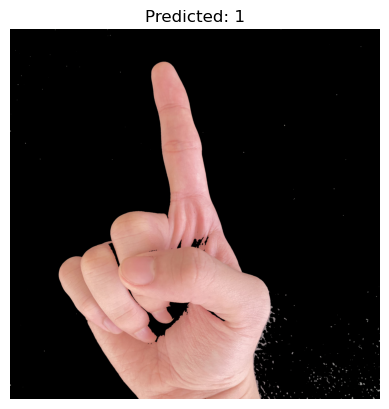

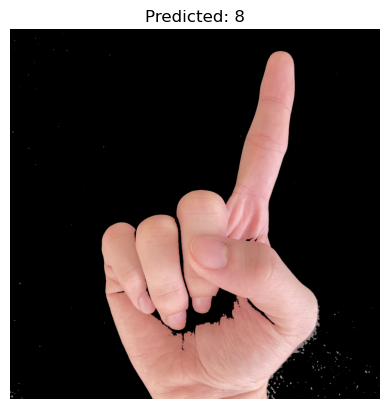

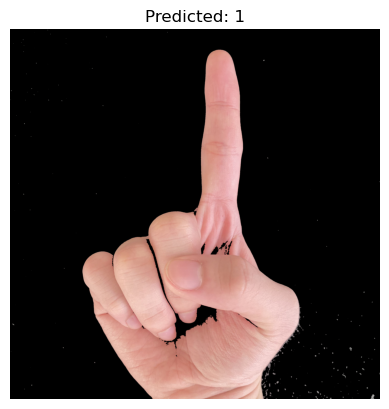

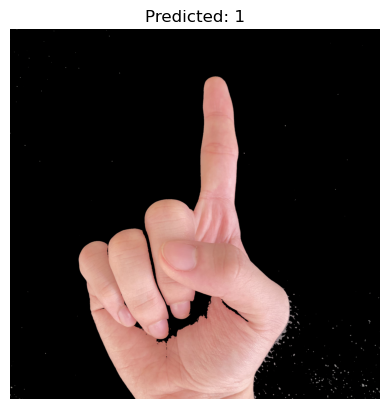

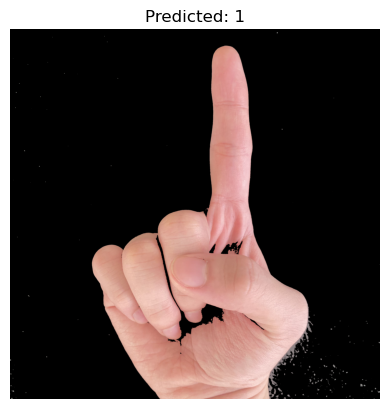

True Digit: 1
Predicted Digits: [1, 8, 1, 1, 1]
Accuracy: 80.0%


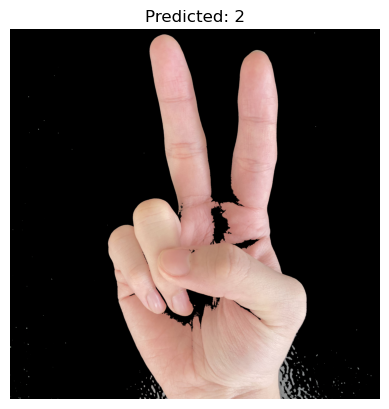

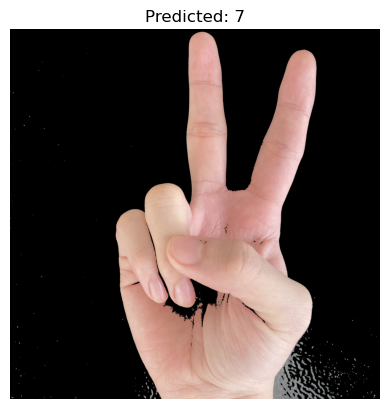

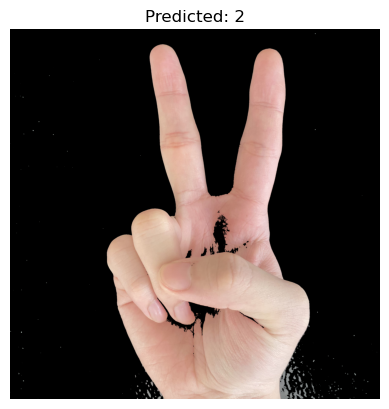

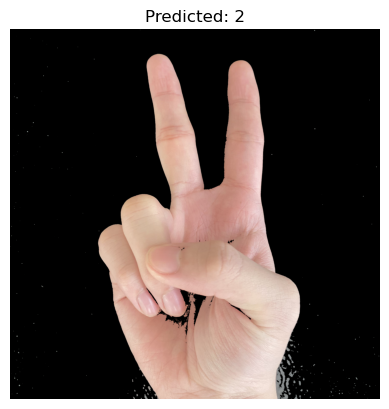

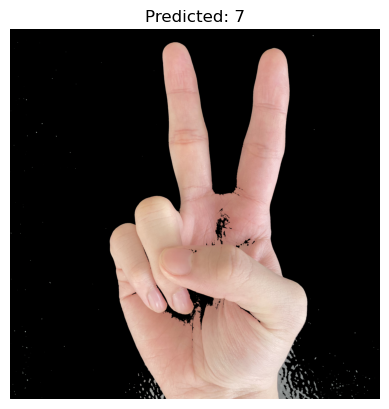

True Digit: 2
Predicted Digits: [2, 7, 2, 2, 7]
Accuracy: 60.0%


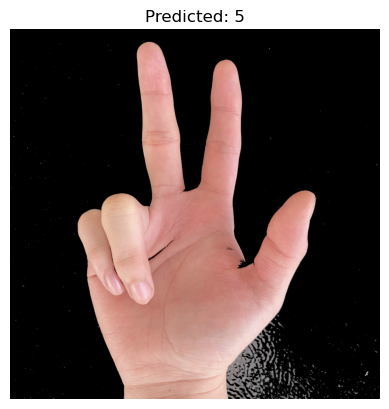

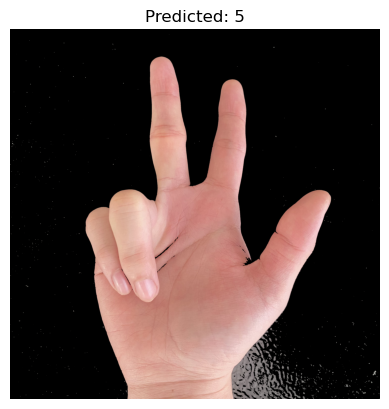

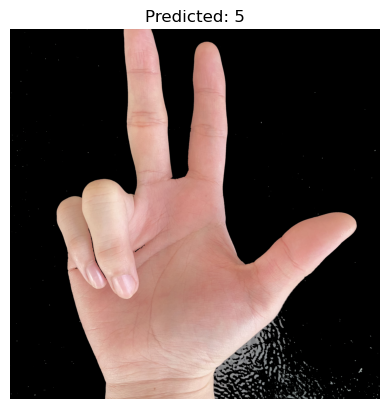

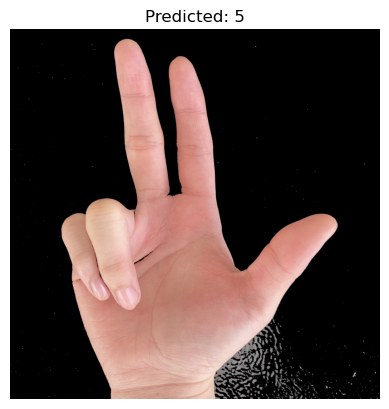

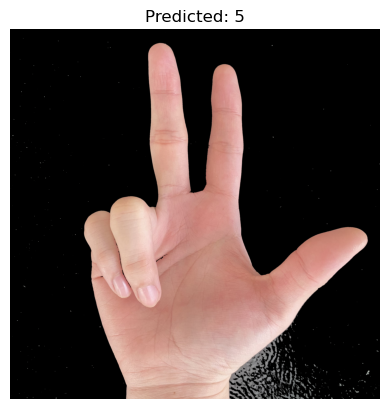

True Digit: 3
Predicted Digits: [5, 5, 5, 5, 5]
Accuracy: 0.0%


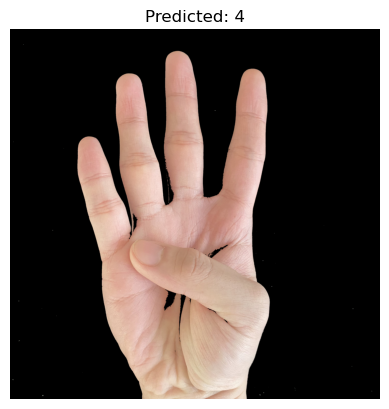

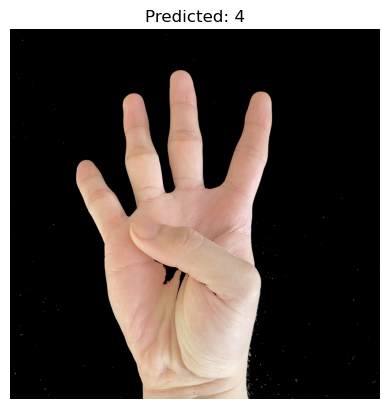

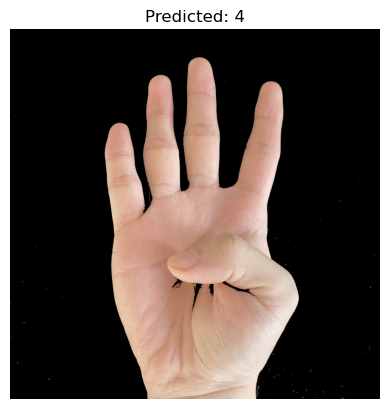

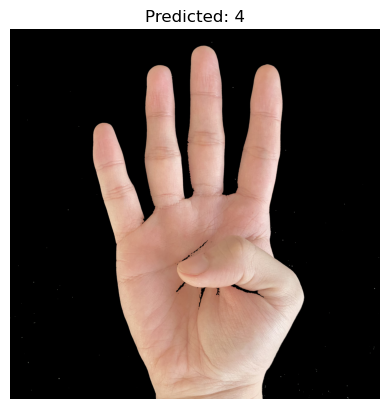

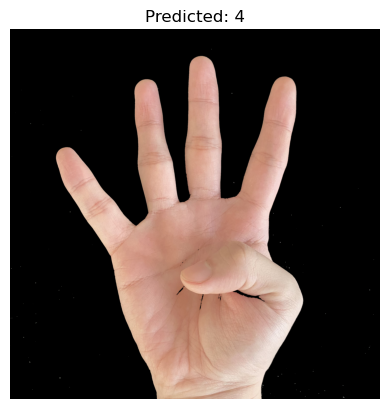

True Digit: 4
Predicted Digits: [4, 4, 4, 4, 4]
Accuracy: 100.0%


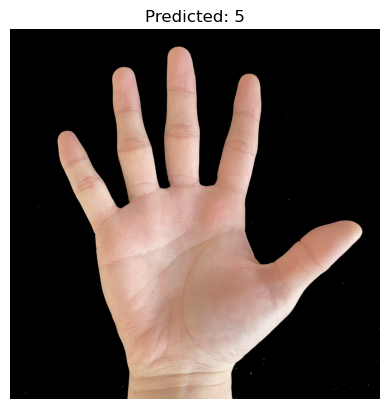

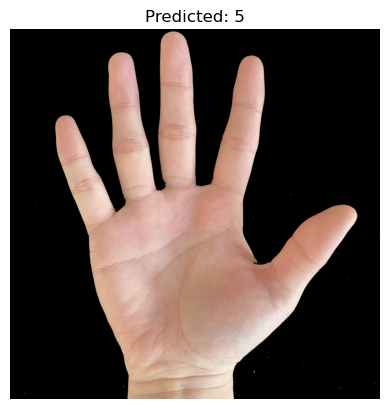

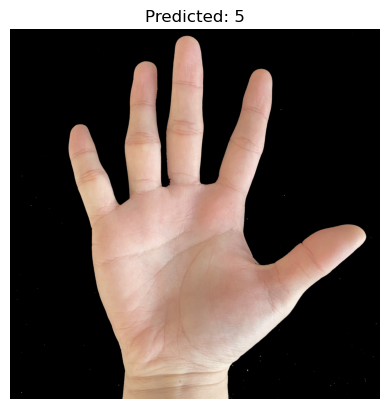

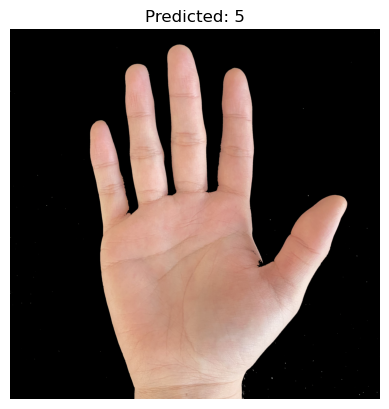

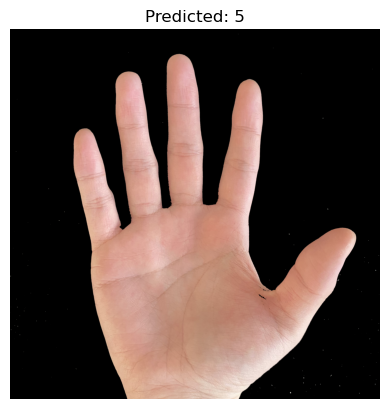

True Digit: 5
Predicted Digits: [5, 5, 5, 5, 5]
Accuracy: 100.0%


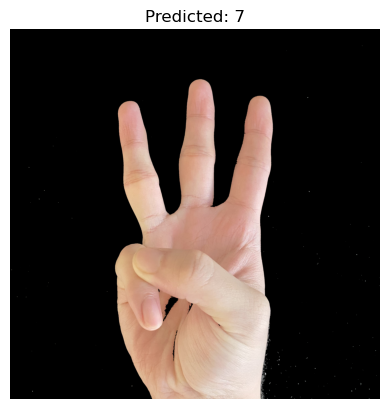

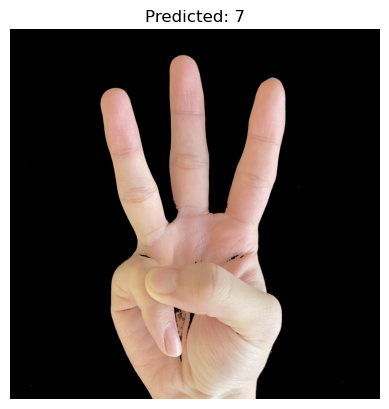

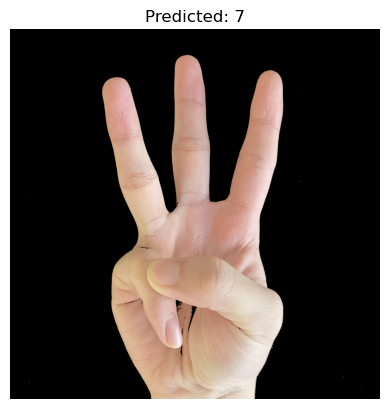

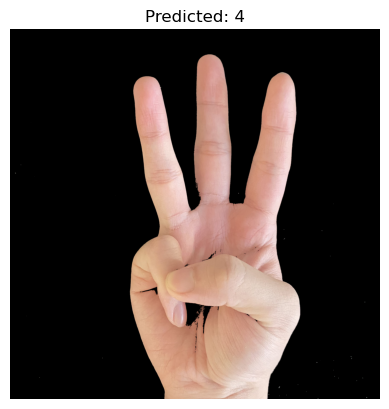

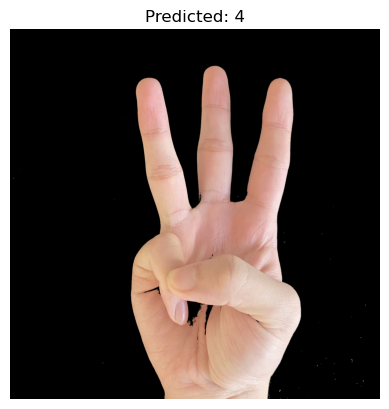

True Digit: 6
Predicted Digits: [7, 7, 7, 4, 4]
Accuracy: 0.0%


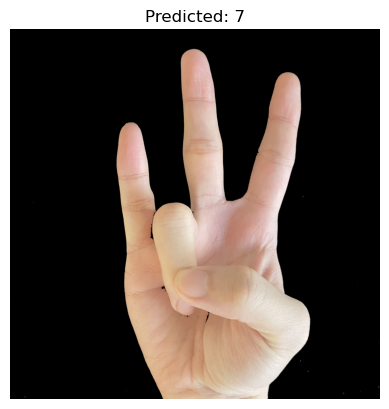

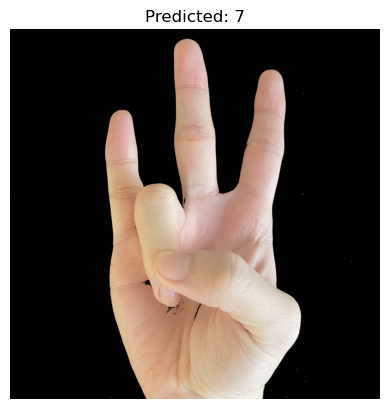

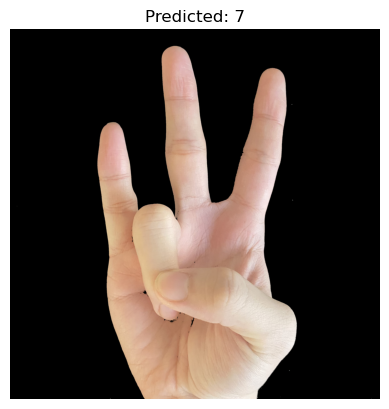

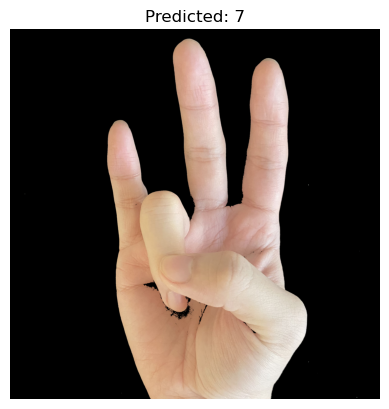

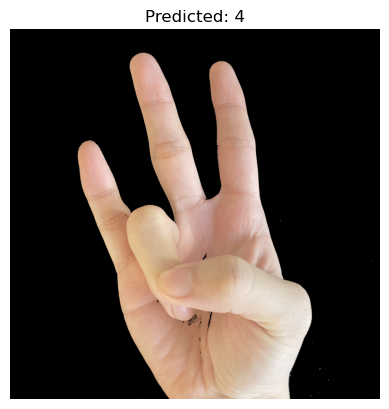

True Digit: 7
Predicted Digits: [7, 7, 7, 7, 4]
Accuracy: 80.0%


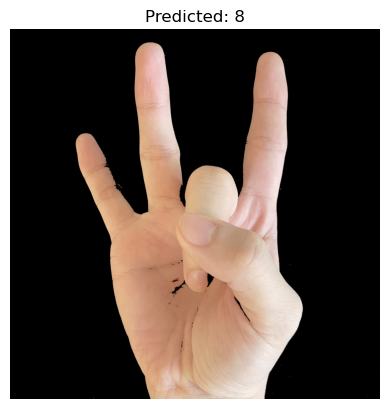

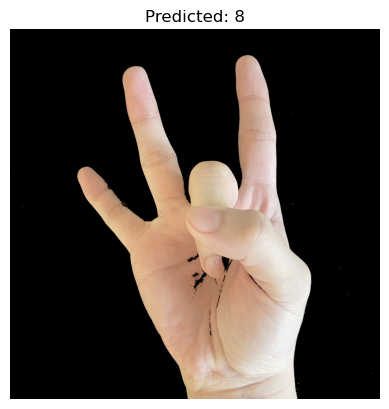

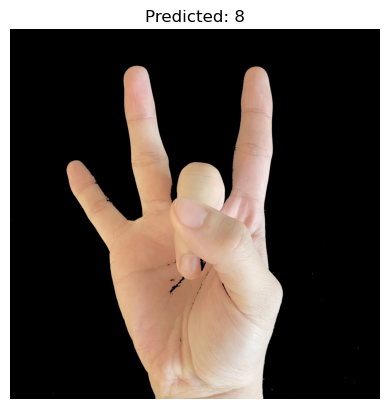

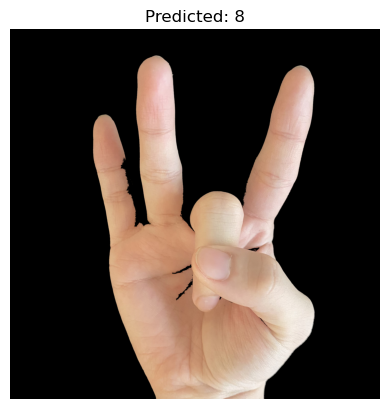

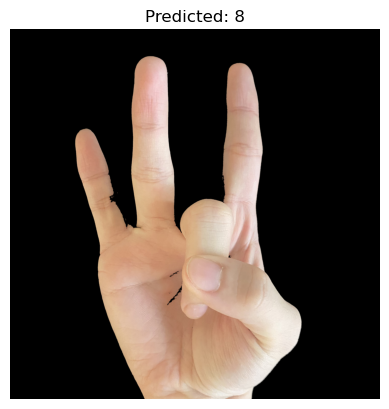

True Digit: 8
Predicted Digits: [8, 8, 8, 8, 8]
Accuracy: 100.0%


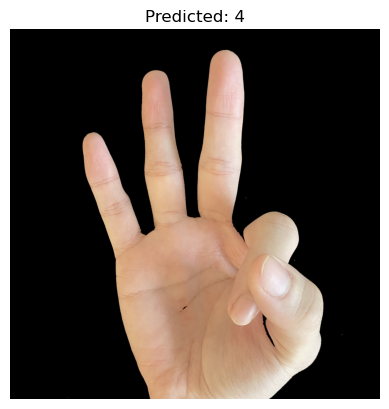

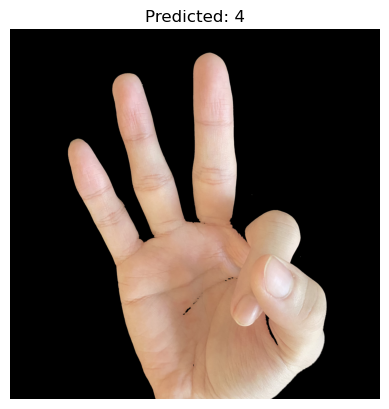

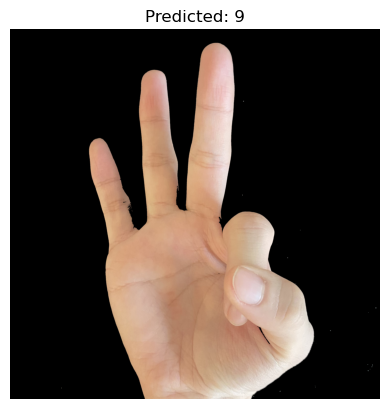

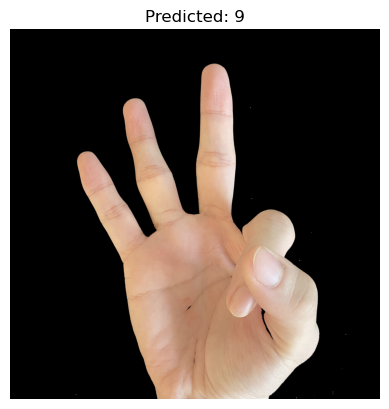

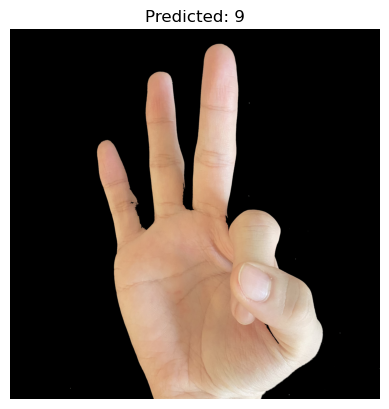

True Digit: 9
Predicted Digits: [4, 4, 9, 9, 9]
Accuracy: 60.0%


In [26]:
# Define a function to predict the digit from a folder of images

results = []

def predict_folder(folder_path, model):
    if not os.path.exists(folder_path):
        raise Exception("Folder path does not exist.")
        
    # Get the true label (folder name) as the expected digit
    true_digit = int(os.path.basename(folder_path))
    predictions = []
    
    # Iterate through the folder
    for img_file in os.listdir(folder_path):
        img_path = os.path.join(folder_path, img_file)
 
        # Check if it's a file
        if os.path.isfile(img_path):
            if img_path.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp')):
            # Load and preprocess the image
                img = Image.open(img_path).convert('RGB')
                img = ImageOps.exif_transpose(img)  # Rotate the image 
                img_simplified = simplify_background(img)  # Apply background simplification
                img_transformed = transform(img_simplified)  # Apply preprocessing 

                # Add batch dimension and pass to model
                img_transformed = img_transformed.unsqueeze(0).to(device)
                model.eval()  # Set the model to evaluation mode
                with torch.no_grad():
                    outputs = model(img_transformed)
                    _, predicted = torch.max(outputs, 1)
                    predicted = predicted.cpu().numpy()[0]  # Extract prediction to numpy
                
                # Append the prediction to the list
                predictions.append(predicted)
                
                # Display the image and prediction result
                plt.imshow(img_simplified)
                plt.title(f'Predicted: {predicted}')
                plt.axis('off')
                plt.show()
    
     # Calculate accuracy by comparing predictions with true_digit
    correct_predictions = sum(1 for pred in predictions if pred == true_digit)
    total_predictions = len(predictions)
    if total_predictions == 0:
        accuracy = na
    else:
        accuracy = correct_predictions / total_predictions * 100
    results.append([true_digit, predictions, accuracy])
    
    print(f"True Digit: {true_digit}")
    print(f"Predicted Digits: {predictions}")
    print(f"Accuracy: {accuracy}%")
    
def is_number(s):
    try:
        int(s)
        return True
    except ValueError:
        return False
    
# Predict the digits for each subfolder
base_folder = "/Users/jane/Desktop/Hand_W"  # Base folder containing subfolders 0-9
for subfolder in sorted(filter(is_number, os.listdir(base_folder)), key=lambda x: int(x)):
    subfolder_path = os.path.join(base_folder, subfolder)
    if os.path.isdir(subfolder_path):
        predict_folder(subfolder_path, model)
    

In [27]:
df_results = pd.DataFrame(results, columns=['True Number', 'Predicted Number', 'Accuracy'])
print(df_results)

   True Number Predicted Number  Accuracy
0            0  [0, 0, 0, 0, 0]     100.0
1            1  [1, 8, 1, 1, 1]      80.0
2            2  [2, 7, 2, 2, 7]      60.0
3            3  [5, 5, 5, 5, 5]       0.0
4            4  [4, 4, 4, 4, 4]     100.0
5            5  [5, 5, 5, 5, 5]     100.0
6            6  [7, 7, 7, 4, 4]       0.0
7            7  [7, 7, 7, 7, 4]      80.0
8            8  [8, 8, 8, 8, 8]     100.0
9            9  [4, 4, 9, 9, 9]      60.0
